# Loading and Manipulating Sensor Data

Reality capture is the process of creating digital 3D representations of real-world scenes from sensor data, like images and LiDAR. To represent captured sensor data, `fvdb_reality_capture`  makes use of the `SfmScene` class, which is a lightweight handle to sensor data stored on disk. `SfmScene` offers a wide range of features for efficiently transforming large-scale datasets. In this tutorial we'll go over the features of `SfmScene`, and show how it can be used to load and tranform data efficiently. In particular, we'll cover the following topics

1. **[Part 1](#Loading-data-into-an-SfmScene)**: How to load a 3D capture dataset containing posed images and points into memory using `SfmScene`
2. **[Part 2](#Visualizing-and-inspecting-an-SfmScene)**: How to visualize the capture interactively in 3D using `fvdb.viz` and how to plot information about it using matplotlib.
3. **[Part 3](#basic-sfmscene-manipulation)**: How to perform basic manipulation operations such as filtering points and images.
4. **[Part 4](#transforming-an-sfmscene-with-fvdb_reality_capturetransforms)**: Transforming and cleaning datasets using `fvdb_reality_capture.transforms`
5. **[Part 5](#defining-custom-sfmscene-transformations)**: Defining custom transformations on datasets by subclassing `fvdb_reality_capture.transforms.BaseTransform`


## Setup and imports

Before we get started, let's import the pacakges we need. Here's an overview of some of the important ones:

* `logging`
    - We'll use the built-in Python `logging` module, and call `logging.basicConfig()` which will cause functions within `fvdb_reality_capture` to log to stdout. You don't have to enable this, but it's useful to see what's happening under the hood.
* `fvdb` 
    - We use `fvdb` here for interactive visualization (using the `fvdb.viz`) module.
* `fvdb_reality_capture` 
    - We use this for core algorithms that help us read and process capture data (Duh!)
*  `fvdb_reality_capture.sfm_scene.SfmScene/SfmPosedImageMetadata/SfmCameraMetadata`
    - We load the `SfmScene`, `SfmPosedImageMetadata`, and `SfmCameraMetadata` directly since we'll them a lot in this tutorial. These encode informatin about the dataset, specific posed images in the dataset, and cameras used to capture the dataset respectively.

In [1]:
# We'll use a few libraries in this tutorial for logging, plotting, image processing, and
# numerical computation
import fvdb_reality_capture as frc
import cv2
import numpy as np
import matplotlib.pyplot as plt
import logging
import tqdm
import fvdb

# We'll import SfmScene directly since we're going to use it a lot
from fvdb_reality_capture.sfm_scene import SfmScene, SfmPosedImageMetadata, SfmCameraMetadata

# Let's use verbose logging to track what happens under the hood.
# For less output set level=logging.WARN. For more set level=logging.DEBUG
logging.basicConfig(level=logging.INFO, format="%(message)s")

# Initialize the fvdb.viz server for interactive visualization
fvdb.viz.init(port=8080)

Viewer Info: Running in headless mode - no GLFW window created


## Download some example data
Let's download some example data to run on. We'll use the *"mipnerf360"* example dataset. This dataset is the output of a [COLMAP](https://colmap.github.io/) structure from motion pipeline on a sequence of images captured by a handheld camera. This dataset was originally released  as part of the [MipNeRF-360 paper](https://arxiv.org/abs/2111.12077).

It contains posed images (i.e. images + the position and orientation of the camera that took them), camera intrinsic parameters (focal length, optical centers, etc.), and a set of sparse 3D points at known surfaces in the scene.

In [2]:
# Let's start by downloading some capture data. This will download a set of representative 3D capture
# datasets to a folder called "data/".
frc.download_example_data(dataset="mipnerf360", download_path="./data")

Viewer Info: Server created on port(8080)
Viewer Info: Running on server 127.0.0.1:8080


2025-10-20 11:48:34,069 - fvdb_reality_capture.tools._download_example_data.download_example_data - INFO - Downloading dataset mipnerf360 from https://fvdb-data.s3.us-east-2.amazonaws.com/fvdb-reality-capture/360_v2.zip to data/360_v2/360_v2.zip
2025-10-20 11:58:52,303 - fvdb_reality_capture.tools._download_example_data.download_example_data - INFO - Dataset downloaded successfully.
2025-10-20 11:58:52,303 - fvdb_reality_capture.tools._download_example_data.download_example_data - INFO - Extracting archive 360_v2.zip to data/360_v2.


## Loading data into an `SfmScene`

Let's load our downloaded dataset into an `SfmScene`, the main class for manipulating sensor data in `fvbd_reality_capture`. The data is located at `data/360_v2`, and consists of seven captures, each in its own directory (_e.g._ `data/360_v2/bicycle`, `data/360_v2/garden`, etc.). The layout of this directory is not important for this tutorial since loading it is handled by `fvdb_reality_capture`, but if you're curious you can [read about the COLMAP data format here](https://colmap.github.io/format.html).

An `SfmScene` consists of the following parts representing a scene captured with sensors:
 1. A list of **Posed images**. 
    - Images with camera-to-world/world-to-camera transformations specifying where each image was taken in the scene, and the identifier of the camera that captured them.
 2. A set of **Camera sensors**.
    - Information such as camera intrinsics and distortion parameters for each camera used to capture the scene. 
    - *Note the number of cameras is not the same as the number of posed images. If you captured 1000 images with a robot that had two cameras, there will be two cameras and 1000 posed images*
 2. A  set of **Scanned 3D points** 
    - These are points for which we have high confidence lie on a surface in the scene.
 3. An (optional) **Point visibility map**
    - These define the set of points visible within each posed image.

This type of sensor data may arise from capture hardware (_e.g._ a set of cameras and LiDAR sensors equipped with [Inertial Measurement Units (IMU)](https://en.wikipedia.org/wiki/Inertial_measurement_unit) sensors), or [from Structure-from-Motion (Sfm)](https://en.wikipedia.org/wiki/Structure_from_motion) capture which solves for camera poses and points using correspondences between a set of images. `fvdb_reality_capture` aims to support loading a wide variety of capture data formats into an `SfmScene`.

First, we use the `from_colmap` method on `SfmScene` to read in a `COLMAP` directory. We'll also print out some of the properties listed above.

In [3]:
# Load the "garden" capture from the downloaded data into an SfmScene
sfm_scene: SfmScene = SfmScene.from_colmap("data/360_v2/garden")

# Print some properties of the loaded SfmScene
print("---------------------------------------")
print(f"The scene was captured using {len(sfm_scene.cameras)} {'camera' if len(sfm_scene.cameras) == 1 else 'cameras'}.")
print(f"The scene consists of {len(sfm_scene.images)} posed images.")
print(f"The scene contains {len(sfm_scene.points)} points.")
if sfm_scene.has_visible_point_indices:
    print(f"Each image has visible point indices.")
else:
    print(f"Images do not have visible point indices.")
print("---------------------------------------")

2025-10-20 11:59:15,918 - fvdb_reality_capture.sfm_scene._load_colmap_scene.load_colmap_scene - INFO - Computing and caching visible points per image...
100%|██████████| 138766/138766 [00:00<00:00, 238245.57it/s]

---------------------------------------
The scene was captured using 1 camera.
The scene consists of 185 posed images.
The scene contains 138766 points.
Each image has visible point indices.
---------------------------------------


## Visualizing and inspecting an `SfmScene`

Now that we've loaded our dataset into an `SfmScene`, let's inspect the scene. We'll first show an interactive visualization of the SfmScene's points, and cameras using the `fvdb.viz` module, a high performance 3D visualization module in `fvdb`. We'll then plot some images from the scene as well as their visible points, and print some information about each image.

The points in an `SfmScene` have uint8 RGB values associated with them in the `points_rgb` attribute. We'll use these to color the points. We'll also make use of the `camera_to_world_matrices`, `projection_matrices` and `image_sizes` attributes which let us quickly get the camera-to-world transformation, projection matrix, and image size for each posed image in the scene.


In [4]:
# Get a handle to an `fvdb.viz.Scene` which we'll add objects we want to visualize
viz_scene = fvdb.viz.get_scene()

# Add a point cloud representing the SfmScene's points.
# We'll use the points_rgb attribute to color the points by their colors. Note this attribute is a uint8
# array and we need to convert it to float32 and normalize it to [0,1] for visualization.
# Each point will be plotted with a size of 2.0 pixels
viz_scene.add_point_cloud(
    name="SfmScene Points",
    points=sfm_scene.points,
    colors=sfm_scene.points_rgb.astype(np.float32) / 255.0,
    point_size=2.0, # Pixel units
)

# We'll visualize the cameras in the SfmScene as a set of camera frustums with coordinate axes showing the
# right-up-forward directions of each camera.
# We'll use the camera_to_world_matrices and projection_matrices attributes of the SfmScene to get the
# necessary matrices to visualize the cameras.
viz_scene.add_cameras(
    "SfmScene Cameras",
    camera_to_world_matrices=sfm_scene.camera_to_world_matrices,
    projection_matrices=sfm_scene.projection_matrices,
    image_sizes=sfm_scene.image_sizes,
)

# Set the viewer camera to be at the position of the first camera in the SfmScene, and looking towards the median of all
# points in the scene
first_camera_position = sfm_scene.images[0].origin # origin is the camera position in world space of the posed image
scene_median = np.median(sfm_scene.points, axis=0) # median of all points in the scene
viz_scene.set_camera_lookat(
    eye=first_camera_position,
    center=scene_median,
    up=(0, -1, 0), # This data was captured with -y up
)

# Show the visualization in the notebook cell
fvdb.viz.show()


Let's also plot some specific images in the scene as well as the set of visible points from those images. 
We'll use matplotlib to plot a row of images for different image ids with their visible points. 

The code below makes use of the `images` property of an `SfmScene`, which is a list of `SfmPosedImageMetadata` objects, each of which  contains information about a particular posed image in the dataset.
Among other things, an `SfmPosedImageMetadata` object consists of:
 - `image_path (str)`: the paths to the image file on disk.
 - `mask_path (str)`: the path to a binary mask for the image on disk (if available, otherwise an empty string)
 - `camera_to_world_matrix / world_to_camera_matrix (np.ndarray)`: the 4x4 camera-to-world/world-to-cammera transformations encoding where in space the image was captured.
 - `point_indices (np.ndarray)`: The visible from this images as integer indices into `SfmScene.points`. *i.e.* `sfm_scene.points[sfm_scene.images[i].point_indices]` is the set of points visible from image `i`.
  - `cmera_metadata (SfmCameraMetadata)`: An `SfmCameraMetadata` object containing information about the camera sensor used to capture the image.

Each posed image refers to a `SfmCameraMetadata` object encoding information about the sensor that captured it. The set of all sensors used to capture the scene is available through the `SfmScene.cameras` attribute which is a dict mapping unique integer IDs per sensor to `SfmCameraMetadata` objects. The main properties of the `SfmCameraMetadata` class are:
 - `projection_matrix (np.ndarray)`: The 3x3 perspective or orthographic projection matrix used to transform points from camera space to pixel space.
 - `fx/fy (float)`: The x and y focal lengths in pixel units.
 - `cx/cy (float)`: The optical center coordinates in pixel units.
 - `image_width/image_height (int)`: The width and height of the camera sensor (in pixels).
 - `camera_type (SfmCameraType)`: The type of camera sensor (*e.g.* `PINHOLE`, `RADIAL`, `OPENCV_FISHEYE`). 
 - `distortion_parameters (np.ndarray)`: Distortion parameters that can be used to undistort an image (via the `undistort_map_x|y|roi` properties). 

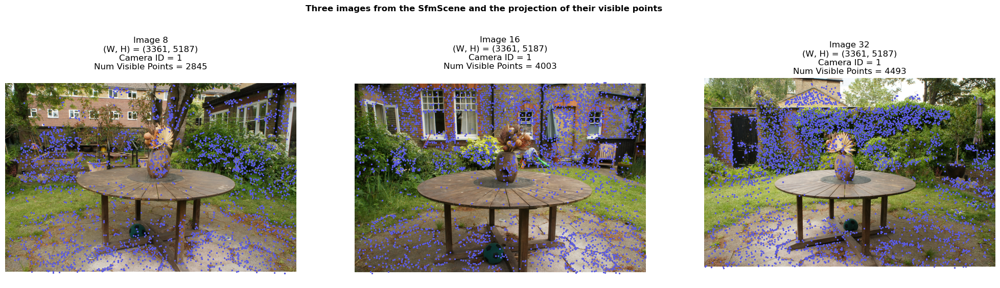

In [5]:
# Visualize an image in an SfmScene and the 3D points visible from that images
# projected onto the image plane as blue dots.
def plot_image_from_scene(scene: SfmScene, image_id: int, point_color: str):
    # Here we get metadata about the image_id^th image in the dataset
    image_meta: SfmPosedImageMetadata = scene.images[image_id]

    # Here we get metatada about the camera that capured the image
    camera_meta: SfmCameraMetadata = image_meta.camera_metadata

    # Get the visible 3d points for this image
    # scene.points returns the set of all points in the scene, and
    # image_meta.point_indices returns the indices of the points visible in the image
    assert image_meta.point_indices is not None, f"No points are visible in image {image_id}"
    visible_points_3d: np.ndarray = scene.points[image_meta.point_indices]

    # Project those points onto the image plane
    # 1. Get the world -> camera space transform and projection matrix
    #  - The world-to-camera matrix is a property of the image since it varies over images.
    #  - The projection matrix is a property of the camera since it varies
    #    per-camera but is the same for all images captured with that camera
    # The world_to_camera_matrix is a (4, 4)-shaped numpy array encoding an SE(3) transform as a 4x4
    # matrix.
    # The projection matrix is a (3, 3)-shaped numpy array encoding a perspective projection
    # from 3D to 2D.
    world_to_cam_matrix: np.ndarray = image_meta.world_to_camera_matrix
    projection_matrix: np.ndarray = camera_meta.projection_matrix

    # 2. Transform world points to camera space using the world-to-camera matrix.
    # The camera coordinate space is one where the camera center lies at the origin (0, 0, 0),
    # the +Z axis is looking down the center of the image, the +X axis points along the right of
    # the image, and the +Y axis points upward in the image.
    visible_points_3d_cam_space = world_to_cam_matrix[:3,:3] @ visible_points_3d.T + world_to_cam_matrix[:3,3:4]

    # 3. Transform camera space coordinates to image space (pixel) coordinates using the
    #    projection matrix.
    # The projection matrix transforms camera coordinates to image space and has the form
    # [[fx, 0,  cx],
    #  [0,  fy, cy],
    #  [0,  0,  1]]
    # where (fx, fy) are the x and y focal lengths (in pixel units), and (cx, cy) is the optical
    # center (in pixel units).
    visible_points_2d = projection_matrix @ visible_points_3d_cam_space
    visible_points_2d /= visible_points_2d[2]

    # Load the image and convert to RGB (OpenCV uses BGR by default)
    loaded_image = cv2.imread(image_meta.image_path)
    assert loaded_image is not None, f"Failed to load image at {image_meta.image_path}"
    loaded_image = cv2.cvtColor(loaded_image, cv2.COLOR_BGR2RGB)

    # If there's a mask associated with this image, use it to zero out
    # masked pixels
    if image_meta.mask_path:
        mask = cv2.imread(image_meta.mask_path, cv2.IMREAD_GRAYSCALE)
        assert mask is not None, f"Failed to load mask at {image_meta.mask_path}"
        loaded_image *= (mask[..., np.newaxis] > 127)

    # Plot the image and projected points as blue dots and some info about the image in the title
    plt.title(f"Image {image_id}\n(W, H) = {image_meta.image_size}\nCamera ID = {image_meta.camera_id}\nNum Visible Points = {len(visible_points_3d)}")
    plt.axis("off")
    plt.imshow(loaded_image)
    plt.scatter(visible_points_2d[0], visible_points_2d[1], color=point_color, marker=".", s=8)


def plot_three_images(scene: SfmScene, title: str, title_color=None, point_color="#5b5be2ff"):
    # Plot three images and points alongside each other
    plt.figure(figsize=(25, 7))
    plt.suptitle(title, color=title_color, fontweight='bold')
    plt.subplot(1, 3, 1)
    plot_image_from_scene(scene, 8, point_color=point_color)
    plt.subplot(1, 3, 2)
    plot_image_from_scene(scene, 16, point_color=point_color)
    plt.subplot(1, 3, 3)
    plot_image_from_scene(scene, 32, point_color=point_color)
    plt.show()

plot_three_images(sfm_scene, "Three images from the SfmScene and the projection of their visible points")

## Basic `SfmScene` manipulation

We can do basic manipulations on an `SfmScene` such as filtering out certain images or points.
More advanced manipulations can be done using the `fvdb_reality_capture.transforms` module described below.

**NOTE:** `SfmScene` objects are immutable. all operations that manipulate an `SfmScene` will return a new scene. This lets you apply operations non-destructively, and ensures an `SfmScene` is always in a valid state. 

To see a basic example of `SfmScene` manipulation Let's start with a (somewhat contrived) example where we filter out points in the scene whose X
coordinate is less than the X coordinate of the mean of all points. Here we use the `SfmScene.filter_points` which returns a new `SfmScene` with points filtered according to an input mask.

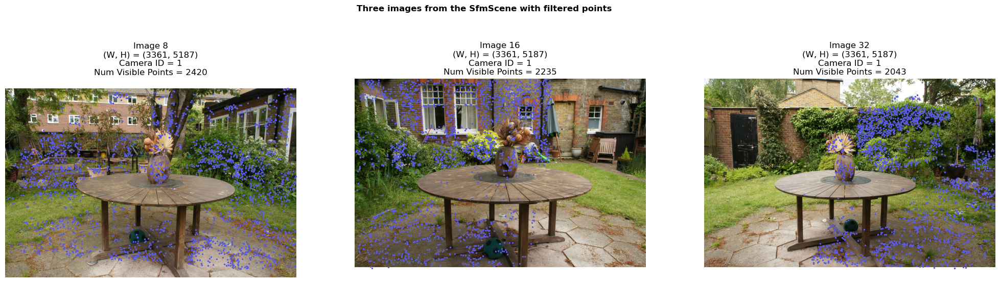

Original scene has 138766 points and filtered scene has 76245 points


In [6]:
# Mean of all points
points_mean = np.mean(sfm_scene.points, axis=0)

# Construct a Boolean mask for points with X >= mean X. True values mean keep the point.
# The mask has one value for each point in the scene.
mask = sfm_scene.points[:, 0] >= points_mean[0]

# Create a new SfmScene with points removed according to the mask.
# NOTE: The set of visible points is automatically updated in the new scene.
filtered_pts_scene = sfm_scene.filter_points(mask)

# Plot three images and points in the new scene alongside each other
plot_three_images(filtered_pts_scene, "Three images from the SfmScene with filtered points")

# Here we see the filtering operation was non-destructive. The original scene is unchanged, and we cn still print its point count.
print(f"Original scene has {sfm_scene.points.shape[0]} points and filtered scene has {filtered_pts_scene.points.shape[0]} points")

Now let's filter out every other image in the dataset using a simple mask. We'll use the `SfmScene.filter_images` method here which filters posed images in a scene based on a mask.
This operation can be useful to remove certain images based on a given criteria (e.g. having too few visible points). Note how the new plot has different images than before, and the printed number of images in the filtered scene is halved.

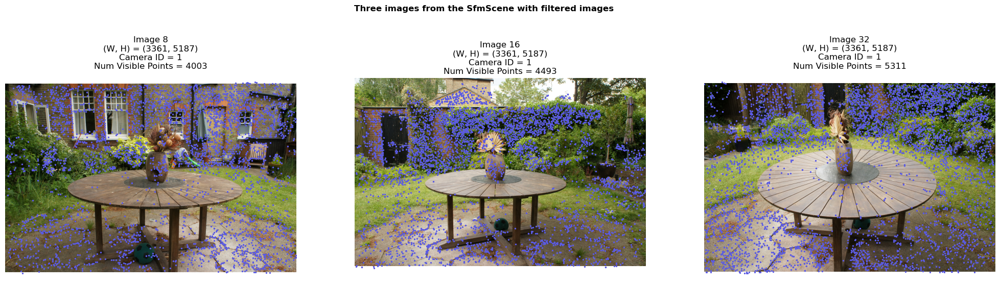

Original scene has 185 images, and filtered scene has 93 images


In [7]:
# Construct a Boolean mask to keep every other posed image in the scene
image_mask = np.zeros(sfm_scene.num_images, dtype=bool)
image_mask[::2] = True # Keep every other image starting from 0

# Create a new SfmScene with images removed according to the mask.
every_other_img_scene = sfm_scene.filter_images(image_mask)

# Plot three images and points in the new scene alongside each other for inspection
plot_three_images(every_other_img_scene, "Three images from the SfmScene with filtered images")

# Here we see the filtering operation was non-destructive. The original scene is unchanged, and we can still print its image count.
print(f"Original scene has {sfm_scene.num_images} images, and filtered scene has {every_other_img_scene.num_images} images")

## Transforming an `SfmScene` with `fvdb_reality_capture.transforms`

`fvdb_reality_capture` comes equipped with a number of more advanced transformations that can be applied to an `SfmScene`. 
These include operations to downsample images, normalize the scene, crop the scene, and filter outlier points. These transformations are implemented in the `fvdb_reality_capture.transforms` module. Each transformation is an object which extends `fvdb_reality_capture.BaseTransform`. A transform's `__call__` method accepts an `SfmScene` and produces a transformed `SfmScene`. You can also subclass `BaseTransform` yourself ([see section below](#defining-custom-sfmscene-transformations)) to define custom transforms.

Transforms in `fvdb_reality_capture` allow for modular and composable data transformation without modifying the underlying dataset on disk. Moreover, transforms make use of a cache to store any intermediate results that are expensive to compute. This means that applying the same transformation twice (even across processes) will only perform expensive computation once. It also means that transforms do not need to materialize an entire dataset in memory (which is often not possible due to memory limitations).

Let's look at some of the built in transforms in the `fvdb_reality_capture.transforms` module. For a full list of built-in transforms, see the [`fvdb_reality_capture.transforms` documentation](https://openvdb.github.io/fvdb-reality-capture/api/transforms.html).

### Downsampling Images in an `SfmScene`
You can downsample images in an `SfmScene` using the `fvdb_reality_capture.transforms.DownsampleImages`. This transform will resize each image in the dataset to a fraction of its original size. It will cache the resulting images with a key that depends on the scaling factor, downsampling method, and image type (*e.g.* whether you save `.png` or `.jpg` downsampled images) which will resize the images and cache them.

2025-10-20 11:59:34,477 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Rescaling images using downsample factor 8, sampling mode 3, and quality 98.
2025-10-20 11:59:34,478 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Attempting to load downsampled images from cache.
2025-10-20 11:59:34,479 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - No downsampled images found in the cache.
2025-10-20 11:59:34,479 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Generating images downsampled by a factor of 8 and saving to cache.
Rescaling DSC08140.JPG from 5187 x 3361 to 648 x 420: 100%|██████████| 185/185 [00:28<00:00,  6.58imgs/s]
2025-10-20 12:00:02,606 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Rescaled 185 images by a factor of 8 and saved to cache with sampling mode 3 and quality 98.


Original size of image 0 is (3361, 5187), downsampled size is (420, 648)


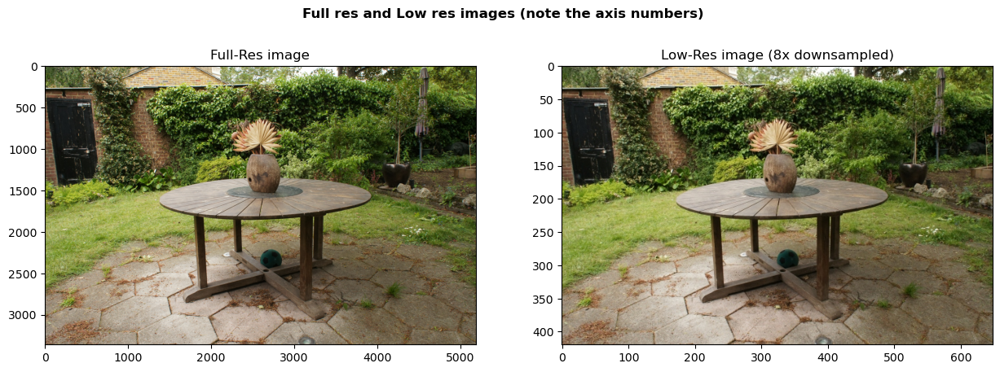

In [8]:
# This transform downsamples images in the scene by a factor of 8
rescale_transform = frc.transforms.DownsampleImages(8)

# Downsample images in the scene. This will cache the downsampled images for later use,
# and update the paths accordingly. The first time you call this, you'll see a progress bar
# showing the downsampling progress.
rescaled_scene = rescale_transform(sfm_scene)

print(f"Original size of image 0 is {sfm_scene.images[0].image_size}, downsampled size is {rescaled_scene.images[0].image_size}")

# Load and display the first image from both the original and downsampled scenes
img0_full_res = cv2.imread(sfm_scene.images[0].image_path)
assert img0_full_res is not None, "Failed to load full resolution image"
img0_full_res = cv2.cvtColor(img0_full_res, cv2.COLOR_BGR2RGB)
img0_low_res = cv2.imread(rescaled_scene.images[0].image_path)
assert img0_low_res is not None, "Failed to load low resolution image"
img0_low_res = cv2.cvtColor(img0_low_res, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 5))
plt.suptitle("Full res and Low res images (note the axis numbers)", fontweight="bold")
plt.subplot(1, 2, 1)
plt.title("Full-Res image")
plt.imshow(img0_full_res)
plt.subplot(1, 2, 2)
plt.title("Low-Res image (8x downsampled)")
plt.imshow(img0_low_res)
plt.show()

Whew, that took a while 😂! The first time you run this transformation, it builds a cache of all the downsampled images for re-use later. After that, applying the same transformation again will re-use the cached images and will be instantaneous. Let's run the transform again and time the result:

In [9]:
# Running the transform again is instantaneous since it re-uses the cached images, and only updates the
# paths in to the images in the output scene
%time rescaled_scene = rescale_transform(sfm_scene)

2025-10-20 12:00:03,360 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Rescaling images using downsample factor 8, sampling mode 3, and quality 98.
2025-10-20 12:00:03,360 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Attempting to load downsampled images from cache.


CPU times: user 33 ms, sys: 16.3 ms, total: 49.3 ms
Wall time: 48.8 ms


### Normalizing an `SfmScene`
Let's look another example showing how to normalize a scene with `fvdb_reality_capture.transforms.NormalizeScene`. 
This transforms the positions of the scene's points and cameras using different approaches which can be controlled by passing an argument to the constructor.

In this case, we'll center the scene about its median then align it with the principal axes of the points, such that the +Z axis points along the principal axis with the least significant eigenvalue. This usually has the effect of aligning the scene with +Z being the up direction (since you often capture more surface area than height). In the code below, we apply the transformation and plot the points from the original (red) and transformed (green) scene. Note how the transformed scene's up direction aligns with the +Z direction, while the original points are rotated and shifted.

In [10]:
# Normalize a scene by first centering it about the median of its points
# and then aligning the coordinates with the principal axes of the scene's points.
# Other types of normalization exist as well such as ecef2enu for geospatial normalization
normalization_transform = frc.transforms.NormalizeScene(normalization_type="pca")
normalized_scene = normalization_transform(sfm_scene)

print(f"Before normalization, scene center is at {np.median(sfm_scene.points, axis=0)}, with scale {sfm_scene.image_camera_positions.max(0) - sfm_scene.points.min(0)}")
print(f"After normalization, scene center is at {np.median(normalized_scene.points, axis=0)} with scale {normalized_scene.image_camera_positions.max(0) - normalized_scene.points.min(0)}")

# Plot the normalized scene using green points and camera frusta
viz_scene = fvdb.viz.get_scene()
viz_scene.add_point_cloud(
    name="Normalized SfmScene Points",
    points=normalized_scene.points,
    colors=[0.2, 0.8, 0.2],
    point_size=2.0,
)
viz_scene.add_cameras(
    "Normalized SfmScene Cameras",
    camera_to_world_matrices=normalized_scene.camera_to_world_matrices,
    projection_matrices=normalized_scene.projection_matrices,
    image_sizes=normalized_scene.image_sizes,
    frustum_color=[0.2, 0.8, 0.2],
)

# Plot the original scene using red points and camera frusta for comparison
viz_scene.add_point_cloud(
    name="Original SfmScene Points",
    points=sfm_scene.points,
    colors=[0.8, 0.2, 0.2],
    point_size=1.0,
)
viz_scene.add_cameras(
    "Original SfmScene Cameras",
    camera_to_world_matrices=sfm_scene.camera_to_world_matrices,
    projection_matrices=sfm_scene.projection_matrices,
    image_sizes=sfm_scene.image_sizes,
    frustum_color=[0.8, 0.2, 0.2],
)


# Set the camera to be at the position of the first camera in the normalized scene, and looking towards the median of
# all points in the normalized scene with the up axis as +Z
viz_scene.set_camera_lookat(
    eye=normalized_scene.images[0].origin,
    center=np.median(normalized_scene.points, axis=0),
    up=(0, 0, 1),
)

fvdb.viz.show()


2025-10-20 12:00:03,412 - fvdb_reality_capture.transforms.normalize_scene.NormalizeScene - INFO - Normalizing SfmScene with normalization type: pca


Before normalization, scene center is at [0.1907731 2.1362865 1.4691257], with scale [43.7783128  41.03833703 25.50118337]
After normalization, scene center is at [-0.03681892 -0.06804667 -0.36076348] with scale [63.3367801  51.44563238  6.40027823]


### Cropping an `SfmScene`
We'll see one more transform (`CropScene`) which crops a scene to a given bounding box. This transform will remove points outside the bounding box, mask out pixels in images which correspond to rays that do not intersect that bounding box, and update the visible points per posed image.. 

**NOTE:** By default, an `SfmScene`'s `scene_bbox` property is `[-inf, -inf, -inf, inf, inf, inf]` *i.e*, spanning all of 3D space. This property defines the domain of the scene. `CropScene` will set this property to the specified bounding box. 

**NOTE:** `CropScene` does **not** crop cameras outside the bounding box since those cameras may still see points in the bounding box. 

Before using the `CropScene`, we'll define a new plotting function which plots the projection of an `SfmScene`'s `scene_bbox` onto an image. Note that the masks may look a bit larger than the set of visible points here, because the mask applies to rays which don't intersect the bounding box.

2025-10-20 12:00:03,506 - fvdb_reality_capture.transforms.crop_scene.CropScene - INFO - Cropping scene to bounding box: [ 0.1907731  2.1362865 -0.5        5.         5.         5.       ]
2025-10-20 12:00:03,617 - fvdb_reality_capture.transforms.crop_scene.CropScene - INFO - No masks found in the cache for cropping.
2025-10-20 12:00:03,617 - fvdb_reality_capture.transforms.crop_scene.CropScene - INFO - No transform found in cache, regenerating.
2025-10-20 12:00:03,652 - fvdb_reality_capture.transforms.crop_scene.CropScene - INFO - Computing image masks for cropping and saving to cache.
Computing image masks for cropping: 100%|██████████| 185/185 [00:07<00:00, 23.32imgs/s]


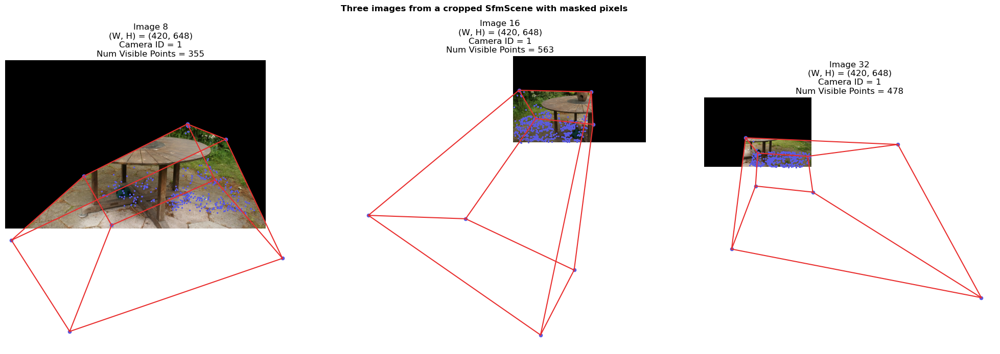

In [11]:
def plot_projected_bbox(scene: SfmScene, image_id: int, point_color: str, line_color):
    min_x, min_y, min_z, max_x, max_y, max_z = scene.scene_bbox

    # Here we get metadata about the image_id^th image in the dataset
    image_meta: SfmPosedImageMetadata = scene.images[image_id]

    # Here we get metatada about the camera that capured the image
    camera_meta: SfmCameraMetadata = image_meta.camera_metadata

    # Get the world -> camera space transform and projection matrix to
    # project bounding box corners onto the image plane
     # The world_to_camera_matrix is a (4, 4)-shaped numpy array encoding an SE(3) transform as a 4x4
    # matrix.
    # The projection matrix is a (3, 3)-shaped numpy array encoding a perspective projection
    # from 3D to 2D.
    world_to_cam_matrix: np.ndarray = image_meta.world_to_camera_matrix
    projection_matrix: np.ndarray = camera_meta.projection_matrix

    # If the scene bbox is infinite, we can't plot it
    if np.any(np.isinf(scene.scene_bbox)):
        return

    # (8, 4)-shaped array representing the corners of the bounding cube containing the input points
    # in homogeneous coordinates
    cube_bounds_world_space_homogeneous = np.array(
        [
            [min_x, min_y, min_z, 1.0],
            [min_x, min_y, max_z, 1.0],
            [min_x, max_y, min_z, 1.0],
            [min_x, max_y, max_z, 1.0],
            [max_x, min_y, min_z, 1.0],
            [max_x, min_y, max_z, 1.0],
            [max_x, max_y, min_z, 1.0],
            [max_x, max_y, max_z, 1.0],
        ]
    )

    # Transform the cube corners to camera space
    cube_bounds_cam_space = (
        world_to_cam_matrix @ cube_bounds_world_space_homogeneous.T
    )  # [4, 8]
    # Divide out the homogeneous coordinate -> [3, 8]
    cube_bounds_cam_space = cube_bounds_cam_space[:3, :] / cube_bounds_cam_space[-1, :]
    cube_bounds_cam_space[-1] = np.maximum(cube_bounds_cam_space[-1], 0.1)

    # Project the camera-space cube corners into image space [3, 3] * [8, 3] - > [8, 2]
    cube_verts_2d = projection_matrix @ cube_bounds_cam_space  # [3, 8]
    # Divide out the homogeneous coordinate and transpose -> [8, 2]
    cube_verts_2d = (cube_verts_2d[:2, :] / cube_verts_2d[2, :]).T

    # Compute a list of line segments for each cube edge as a pair of start and end points
    segments = [
        [cube_verts_2d[0], cube_verts_2d[1]], # [-1, -1, -1] -> [-1, -1, +1]
        [cube_verts_2d[1], cube_verts_2d[3]], # [-1, -1, +1] -> [-1, +1, +1]
        [cube_verts_2d[3], cube_verts_2d[2]], # [-1, +1, +1] -> [-1, +1, -1]
        [cube_verts_2d[2], cube_verts_2d[0]], # [-1, +1, -1] -> [-1, -1, -1]
        [cube_verts_2d[0], cube_verts_2d[4]], # [-1, -1, -1] -> [+1, -1, -1]
        [cube_verts_2d[1], cube_verts_2d[5]], # [-1, -1, +1] -> [+1, -1, +1]
        [cube_verts_2d[2], cube_verts_2d[6]], # [-1, +1, -1] -> [-1, +1, -1]
        [cube_verts_2d[3], cube_verts_2d[7]], # [-1, +1, +1] -> [+1, +1, +1]
        [cube_verts_2d[4], cube_verts_2d[5]], # [+1, -1, -1] -> [+1, -1, +1]
        [cube_verts_2d[5], cube_verts_2d[7]], # [+1, -1, +1] -> [+1, +1, +1]
        [cube_verts_2d[7], cube_verts_2d[6]], # [+1, +1, +1] -> [+1, +1, -1]
        [cube_verts_2d[6], cube_verts_2d[4]], # [+1, +1, -1] -> [+1, -1, -1]
    ]

    # Get the segments in a format compatible with matplotlib
    # i.e. [start_x, end_x], [start_y, end_y]
    segment_x = [[seg[0][0], seg[1][0]] for seg in segments]
    segment_y = [[seg[0][1], seg[1][1]] for seg in segments]

    # Plot the cube edges
    for i in range(len(segment_x)):
        plt.plot(segment_x[i], segment_y[i], color=line_color)

    # Plot the cube vertices
    plt.scatter(cube_verts_2d[:,0], cube_verts_2d[:,1], color=point_color, marker="o", s=20)


def plot_three_images_with_bbox(
        scene: SfmScene,
        title: str,
        title_color=None,
        point_color="#5b5be2ff",
        line_color: str = "#e92d2d"):
    # Plot three images and points alongside each other
    plt.figure(figsize=(25, 8))
    plt.suptitle(title, color=title_color, fontweight='bold')
    plt.subplot(1, 3, 1)
    plot_image_from_scene(scene, 8, point_color=point_color)
    plot_projected_bbox(scene, 8, point_color=point_color, line_color=line_color)
    plt.subplot(1, 3, 2)
    plot_image_from_scene(scene, 16, point_color=point_color)
    plot_projected_bbox(scene, 16, point_color=point_color, line_color=line_color)
    plt.subplot(1, 3, 3)
    plot_image_from_scene(scene, 32, point_color=point_color)
    plot_projected_bbox(scene, 32, point_color=point_color, line_color=line_color)
    plt.show()

# Crop the scene along the XY axis starting from the median X and Y point position
median_point = np.median(rescaled_scene.points, axis=0)
crop_transform = frc.transforms.CropScene(bbox=[median_point[0], median_point[1], -0.5, 5, 5, 5])

# We're transforming the images from the scene with downsampled images here since writing out
# large masks is slow
cropped_scene = crop_transform(rescaled_scene)

plot_three_images_with_bbox(cropped_scene, "Three images from a cropped SfmScene with masked pixels")

### Composing Transforms

A major benefit of `fvdb_reality_capture.transforms` is that they can be composed together to define data processing pipelines. You can compose transforms together with the `fvdb_reality_capture.transforms.Compose` transform, which accepts a sequence of transforms, and composes them into a single transform. The composition of transforms will correctly cache intermediate results (for example cropping images before downsampling and downsampling before cropping will generate different cache entries).
Let's see an example that combines the above three transformations.

2025-10-20 12:00:11,753 - fvdb_reality_capture.transforms.normalize_scene.NormalizeScene - INFO - Normalizing SfmScene with normalization type: pca
2025-10-20 12:00:11,762 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Rescaling images using downsample factor 8, sampling mode 3, and quality 98.
2025-10-20 12:00:11,762 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Attempting to load downsampled images from cache.
2025-10-20 12:00:11,812 - fvdb_reality_capture.transforms.crop_scene.CropScene - INFO - Cropping scene to bounding box: [0. 0. 0. 2. 2. 2.]
2025-10-20 12:00:11,877 - fvdb_reality_capture.transforms.crop_scene.CropScene - INFO - No masks found in the cache for cropping.
2025-10-20 12:00:11,878 - fvdb_reality_capture.transforms.crop_scene.CropScene - INFO - No transform found in cache, regenerating.
2025-10-20 12:00:11,913 - fvdb_reality_capture.transforms.crop_scene.CropScene - INFO - Computing image masks for croppi

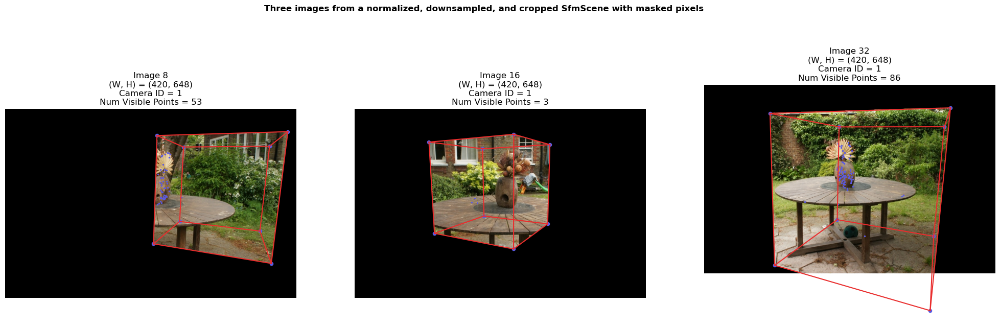

In [12]:
# First normalize the scene, then downsample the images, then crop the downsampled images to a bounding box
# Note how the downsampled images re-use the cache but the bounding box computes a new cache entry
transform = frc.transforms.Compose(
    frc.transforms.NormalizeScene(normalization_type="pca"),
    frc.transforms.DownsampleImages(8),
    frc.transforms.CropScene(bbox=[0, 0, 0, 2, 2, 2]),
)

# Apply the composed transform to the original scene
tx_scene = transform(sfm_scene)

plot_three_images_with_bbox(tx_scene, "Three images from a normalized, downsampled, and cropped SfmScene with masked pixels")

**⚠️ Caveat about transform oder ⚠️**
One caveat about composing transforms is that for some transforms, *order matters*. For example, when you crop a scene, the image masks are pre-computed as part of the transformation. If you normalize the scene after cropping, your images and bounding boxes won't match as expected. This is expected behavior. We are working on solutions to configure this behavior in an upcoming release.

Here we show an example where we crop the scene, which caches image masks, and then normalize the scene. Note how the plotted bounding boxes don't align with the image mask.

2025-10-20 12:00:20,198 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Rescaling images using downsample factor 8, sampling mode 3, and quality 98.
2025-10-20 12:00:20,198 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Attempting to load downsampled images from cache.
2025-10-20 12:00:20,252 - fvdb_reality_capture.transforms.crop_scene.CropScene - INFO - Cropping scene to bounding box: [0. 0. 0. 2. 2. 2.]
2025-10-20 12:00:20,294 - fvdb_reality_capture.transforms.crop_scene.CropScene - INFO - Cached transform does not match input scene transform. Clearing the cache and regenerating transform.
2025-10-20 12:00:20,295 - fvdb_reality_capture.transforms.crop_scene.CropScene - INFO - Computing image masks for cropping and saving to cache.
Computing image masks for cropping: 100%|██████████| 185/185 [00:01<00:00, 124.86imgs/s]
2025-10-20 12:00:21,779 - fvdb_reality_capture.transforms.normalize_scene.NormalizeScene - INFO - Normaliz

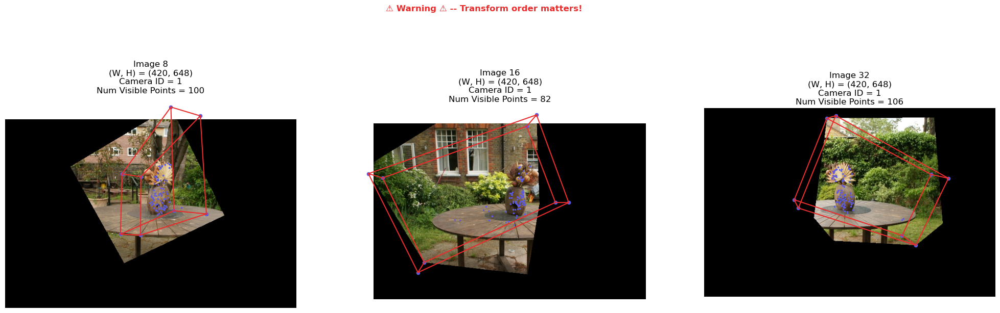

In [13]:
transform = frc.transforms.Compose(
    frc.transforms.DownsampleImages(8),
    frc.transforms.CropScene(bbox=[0, 0, 0, 2, 2, 2]),
    frc.transforms.NormalizeScene(normalization_type="pca"),
)

tx_scene = transform(sfm_scene)

plot_three_images_with_bbox(tx_scene, "⚠️ Warning ⚠️ -- Transform order matters!", title_color="#e92d2d")

## Defining custom `SfmScene` transformations
***⚠️ Warning ⚠️*** *The public transform API is still in development and may change in future releases.*

While `fvdb_reality_capture` provides a set of useful transforms, you may need to write your own for a special use case.

Here's we'll implement a simple (but somewhat contrived) transform that both converts RGB images to BGR, and masks out a box in the middle of each image. It will cache the results and return a new `SfmScene` with the proper masks.

Every transform in `fvdb_reality_capture` must inherit from `fvdb_reality_capture.transforms.BaseTransform` and be decorated with the `@fvdb_reality_capture.transforms.transform` decorator.
It must also implement the following methods:
 - `name()`: A `staticmentod` which returns a unique name for this type of transform
 - `state_dict()`: A method which returns a serlializable (with `torch.save`) seriazed representation of the transform.
 - `from_state_dict(self, state_dict: dict[str, Any])`: A `staticmethod` which constructs this transform from a state dict
 - `__call__(self, input_scene: SfmScene)` which applies this transform to an input `SfmScene`

Let's see how to implement these for our `CropAndConvertToBGR` transform below

In [14]:
from typing import Any

@frc.transforms.transform
class MaskMiddleAndConvertToBGR(frc.transforms.BaseTransform):
    def __init__(self, box_fraction: float):
        super().__init__()
        self._logger = logging.getLogger(f"{self.__class__.__module__}.{self.__class__.__name__}")
        if not (0.0 <= box_fraction <= 1.0):
            raise ValueError("box_fraction must be between 0 and 1 exclusively")
        self._box_fraction = box_fraction

    @staticmethod
    def name() -> str:
        return "MaskMiddleAndConvertToBGR"

    def state_dict(self) -> dict[str, Any]:
        return {"box_fraction": self._box_fraction}

    @staticmethod
    def from_state_dict(state_dict: dict[str, Any]) -> "MaskMiddleAndConvertToBGR":
        if "box_fraction" not in state_dict:
            raise ValueError("state_dict must contain 'box_fraction' key")
        return MaskMiddleAndConvertToBGR(state_dict["box_fraction"])

    def __call__(self, input_scene: SfmScene) -> SfmScene:
        cache: frc.sfm_scene.SfmCache = input_scene.cache

        self._logger.info(f"Applying {self.name()} with box_fraction={self._box_fraction} to SfmScene with {input_scene.num_images} images")

        # We're going to create a unique folder in the cache for the images and masks computed
        # by an instance of this transform.
        # Cache folder names can only contain alphanumeric characters and underscores so we replace
        # the '.' in the box_fraction floating point number with an '_'
        cache_folder_name = f"maskrgb2bgr_bf{str(self._box_fraction).replace('.', '_')}"

        regenerate_cache = False

        # A cache represents a folder on the filesystem that can contain files
        # (e.g. images, masks, etc). Here we either create a new folder in the current cache folder
        # or get a reference to one if it already exists in the cache.
        output_cache = cache.make_folder(cache_folder_name)

        # We generate one image and one mask in the cache for each input image
        # If the number of files in the cache folder is incorrect, we need to regenerate
        if output_cache.num_files != input_scene.num_images * 2:
            self._logger.info(f"Cache folder {output_cache.current_folder_path} has {output_cache.num_files} files, expected {input_scene.num_images * 2}. Regenerating cache.")
            output_cache.clear_current_folder()
            regenerate_cache = True

        # Recompute the images and masks if the cache was missing or incomplete
        if regenerate_cache:
            for i, image_meta in enumerate(tqdm.tqdm(input_scene.images)):
                # Load the image
                img = cv2.imread(image_meta.image_path)
                assert img is not None, f"Failed to load image at {image_meta.image_path}"

                h, w = img.shape[:2]
                crop_h = int(h * self._box_fraction)
                crop_w = int(w * self._box_fraction)
                start_y = (h - crop_h) // 2
                start_x = (w - crop_w) // 2

                # Create a mask that is black in the cropped region and white elsewhere
                mask = np.ones((h, w), dtype=np.uint8) * 255
                mask[start_y:start_y+crop_h, start_x:start_x+crop_w] = 0

                # Save the cropped image and mask to the cache folder
                image_filename = f"image_{i:04d}"
                mask_filename = f"mask_{i:04d}"

                # Also convert the image to BGR
                img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

                # Write the image and mask to the cache
                output_cache.write_file(name=image_filename, data=img, data_type="png")
                output_cache.write_file(name=mask_filename, data=mask, data_type="png")


        # Create new image metadata with updated paths to the cropped images and masks
        new_image_metadata = []
        for i, image_meta in enumerate(input_scene.images):
            image_filename = f"image_{i:04d}.png"
            mask_filename = f"mask_{i:04d}.png"
            new_image_path = output_cache.current_folder_path / image_filename
            new_mask_path = output_cache.current_folder_path / mask_filename
            new_image_meta = SfmPosedImageMetadata(
                world_to_camera_matrix=image_meta.world_to_camera_matrix,
                camera_to_world_matrix=image_meta.camera_to_world_matrix,
                camera_metadata=image_meta.camera_metadata,
                camera_id=image_meta.camera_id,
                image_id=image_meta.image_id,
                image_path=str(new_image_path),
                mask_path=str(new_mask_path),
                point_indices=image_meta.point_indices
            )
            new_image_metadata.append(new_image_meta)

        # Replace the old image metadata with the new one
        return SfmScene(
            cameras=input_scene.cameras,
            images=new_image_metadata,
            points=input_scene.points,
            points_rgb=input_scene.points_rgb,
            points_err=input_scene.points_err,
            transformation_matrix=input_scene.transformation_matrix,
            scene_bbox=input_scene.scene_bbox,
            cache=output_cache,
        )

We can use this new transform like any other transform as above. Let's apply it to the loaded scene to see its effect. Here the transform masks a small box in the middle of each image and converts the colors to BGR.

2025-10-20 12:00:21,989 - __main__.MaskMiddleAndConvertToBGR - INFO - Applying MaskMiddleAndConvertToBGR with box_fraction=0.25 to SfmScene with 185 images
2025-10-20 12:00:22,034 - __main__.MaskMiddleAndConvertToBGR - INFO - Cache folder data/360_v2/garden/_cache/cache_1/maskrgb2bgr_bf0_25 has 0 files, expected 370. Regenerating cache.
  0%|          | 0/185 [00:00<?, ?it/s]

100%|██████████| 185/185 [01:44<00:00,  1.76it/s]


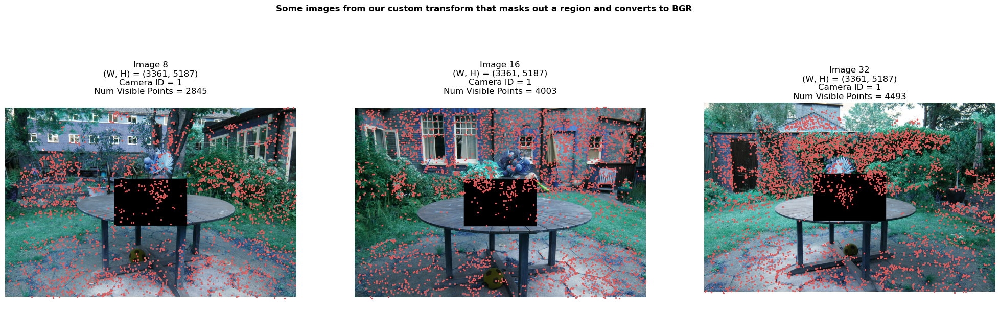

In [15]:
custom_transform = MaskMiddleAndConvertToBGR(box_fraction=0.25)
tx_scene = custom_transform(sfm_scene)

plot_three_images_with_bbox(
    tx_scene,
    "Some images from our custom transform that masks out a region and converts to BGR",
    point_color="#e25b5bff")

We can also compose this transform with any other as before. Let's see an example where we normalize the scene, downscale the images, apply our center mask and BGR conversion, and then crop the scene. Note how the plotted images now include the mask from our transform as well as the mask from the scene cropping.

2025-10-20 12:02:09,455 - fvdb_reality_capture.transforms.normalize_scene.NormalizeScene - INFO - Normalizing SfmScene with normalization type: pca
2025-10-20 12:02:09,465 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Rescaling images using downsample factor 8, sampling mode 3, and quality 98.
2025-10-20 12:02:09,466 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Attempting to load downsampled images from cache.
2025-10-20 12:02:09,521 - __main__.MaskMiddleAndConvertToBGR - INFO - Applying MaskMiddleAndConvertToBGR with box_fraction=0.75 to SfmScene with 185 images
2025-10-20 12:02:09,556 - __main__.MaskMiddleAndConvertToBGR - INFO - Cache folder data/360_v2/garden/_cache/cache_1/downsampled_8x_jpg_q98_m3/maskrgb2bgr_bf0_75 has 0 files, expected 370. Regenerating cache.
100%|██████████| 185/185 [00:14<00:00, 12.46it/s]
2025-10-20 12:02:24,447 - fvdb_reality_capture.transforms.crop_scene.CropScene - INFO - Cropping scene to 

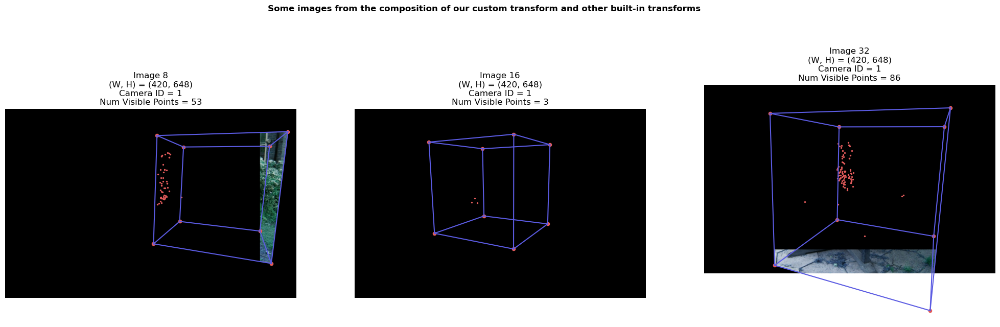

In [16]:
transform = frc.transforms.Compose(
    frc.transforms.NormalizeScene(normalization_type="pca"),
    frc.transforms.DownsampleImages(8),
    MaskMiddleAndConvertToBGR(box_fraction=0.75),
    frc.transforms.CropScene(bbox=[0, 0, 0, 2, 2, 2]),
)

tx_scene = transform(sfm_scene)

plot_three_images_with_bbox(
    tx_scene,
    "Some images from the composition of our custom transform and other built-in transforms",
    point_color="#e25b5bff",
    line_color="#5b5be2ff")

### How caching works in transforms
This note is a bit advanced but important to know if you're writing your own transforms.

A transform modifies an input scene in a way that can possibly be expensive to compute. To deal with this, transforms use a chaching mechanism that let's the transform store the outputs of expensive computations for re-use later without requiring the user to manage a lot of files on the file system. The `fvdb_reality_capture.io.SfmCache` class represents a directory on the filesystem where intermediate data gets stored. You can create (or get a refence to) a subdirectory of the current cache directory using the `Cache.make_folder(name: str)` method. This method returns a new `Cache` object for that subdirectory.

Transforms make extensive use of subdirectories to cache results from a sequence of transforms with a particular set of parameters.

Let's see how this plays out in our example for the transform:
```python
transform = frc.transforms.Compose(
    frc.transforms.NormalizeScene(normalization_type="pca"),
    frc.transforms.DownsampleImages(8),
    MaskMiddleAndConvertToBGR(box_fraction=0.75),
    frc.transforms.CropScene(bbox=[0, 0, 0, 2, 2, 2]),
)
```

This transform does four things encoded as four `BaseTransform` objects:
 1. Normalizes the scene by centering at the median of its points and rotating it to align with the top three principal axes of those points. 
 2. Downsamples every image in the scene by a factor of 8.
 3. Masks out a box in the middle of each image that is 75% of the image size, and converts images to BGR.
 4. Crops points which lie in the box from (0.0, 0.0, 0.0) to (2.0, 2.0, 2.0) and masks out pixels that don't see this box.


Here is how this sequence of transforms leverages the cache. Let's say the sfm_scene starts with a cache directory called `cache/`
 - Normalizing does not cache anythng and just transforms the scene. 
   - The cache directory is `cache/`
 - Downsampling images caches the downsampled images. 
   - The cache directory is `cache/downsampled_8x_jpg_q100_m3/`.
 - Our custom transform caches masks and converted images. 
   - The cache directory is `cache/downsampled_8x_jpg_q100_m3/maskrgb2bgr_bf0_75/`.
 - The crop transform caches masks for the bounding cube as well as a file containing the transformation matrix of the scene. If the transformation matrix for the current scene doesn't match the cached one, the cached images are regenerated. 
   - The cache directory is `cache/downsampled_8x_jpg_q100_m3/maskrgb2bgr_bf0_75/Crop_0_0_0_0_0_0_2_0_2_0_2_0_png_True/`.


Let's say you changed the box fraction in our custom transform from 0.75 to 0.25 after you ran the transform above. This new transform corresponds to the following transform:
```python
transform = frc.transforms.Compose(
    frc.transforms.NormalizeScene(normalization_type="pca"),
    frc.transforms.DownsampleImages(8),
    MaskMiddleAndConvertToBGR(box_fraction=0.25),
    frc.transforms.CropScene(bbox=[0, 0, 0, 2, 2, 2]),
)
```

The result would be as follows:
 - Normalizing the scene happens as usual applying the PCA transform.
   - The cache directory is `cache/`
 - Downsampling images re-uses the existing cached images.
   - The cache directory is `cache/downsampled_8x_jpg_q100_m3/`.
 - Our transform creates a new directory called `maskrgb2bgr_bf0_25`. This directory is empty, so the masks and images need to be regenerated.
   - `cache/downsampled_8x_jpg_q100_m3/maskrgb2bgr_bf0_25/`
 - The `CropScene` transform creates a new directory called `Crop_0_0_0_0_0_0_2_0_2_0_2_0_png_True` inside the `cache/downsampled_8x_jpg_q100_m3/maskrgb2bgr_bf0_25/`. This directory is empty, so the masks for the crop are regenerated.

Note how this pattern let us change some parameters and re-use the existing downsampled images. This mechanism allows us to quickly explore different parameters for transformation while maximally re-using cached information.

Let's see this all in action by running some code:



In [17]:
logging.info("Applying transform_1 to sfm_scene again to see cache reuse")
logging.info("-------------------------------")
# Our original transform. Look at the logs to see that the cache is reused
transform_1 = frc.transforms.Compose(
    frc.transforms.NormalizeScene(normalization_type="pca"),
    frc.transforms.DownsampleImages(8),
    MaskMiddleAndConvertToBGR(box_fraction=0.75),
    frc.transforms.CropScene(bbox=[0, 0, 0, 2, 2, 2]),
)
scene_1 = transform_1(sfm_scene)
logging.info("\n")

logging.info("Applying a new transform_2 with a different downsampling factor to see new cache generation")
logging.info("-------------------------------")
# A new transform with a different downsampling factor. Look at the logs to see that a new cache
# is generated for the downsampled images
transform_2 = frc.transforms.Compose(
    frc.transforms.NormalizeScene(normalization_type="pca"),
    frc.transforms.DownsampleImages(8),
    MaskMiddleAndConvertToBGR(box_fraction=0.25),
    frc.transforms.CropScene(bbox=[0, 0, 0, 2, 2, 2]),
)
scene_2 = transform_2(sfm_scene)

2025-10-20 12:02:33,436 - root - INFO - Applying transform_1 to sfm_scene again to see cache reuse
2025-10-20 12:02:33,436 - root - INFO - -------------------------------
2025-10-20 12:02:33,437 - fvdb_reality_capture.transforms.normalize_scene.NormalizeScene - INFO - Normalizing SfmScene with normalization type: pca
2025-10-20 12:02:33,446 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Rescaling images using downsample factor 8, sampling mode 3, and quality 98.
2025-10-20 12:02:33,446 - fvdb_reality_capture.transforms.downsample_images.DownsampleImages - INFO - Attempting to load downsampled images from cache.
2025-10-20 12:02:33,516 - __main__.MaskMiddleAndConvertToBGR - INFO - Applying MaskMiddleAndConvertToBGR with box_fraction=0.75 to SfmScene with 185 images
2025-10-20 12:02:33,562 - fvdb_reality_capture.transforms.crop_scene.CropScene - INFO - Cropping scene to bounding box: [0. 0. 0. 2. 2. 2.]
2025-10-20 12:02:33,659 - root - INFO - 

2025-10-20 1